In [14]:
import pennylane as qml
from pennylane import numpy as np
import matplotlib.pyplot as plt
import torch

## Random circuit with nearest neighbour entangling single layer

In [263]:
qubits = [2, 3, 4, 5, 6, 8, 10]
variances_global = []
variances_local = []
exp_global=[]
exp_local=[]
num_samples = 1000

for n_qubits in qubits:
    print("number of qubits - ", n_qubits)
    grad_vals_global = []
    grad_vals_local = []
    for i in range(num_samples):
        dev = qml.device("default.qubit", wires=n_qubits)
        dev2 = qml.device("default.qubit", wires=n_qubits)

        gate_set = [qml.RX, qml.RY, qml.RZ]
        random_gate_sequence = {i: np.random.choice(gate_set) for i in range(n_qubits)}

        @qml.qnode(dev, interface="torch", diff_method="backprop")
        def rand_circuit_global(params):
            
            for i in range(n_qubits):
                qml.RY(np.pi / 4, wires=i)

            for i in range(n_qubits):
                random_gate_sequence[i](params[i], wires=i)

            for i in range(n_qubits - 1):
                qml.CZ(wires=[i, i + 1])
            H = np.zeros((2 ** n_qubits, 2 ** n_qubits))
            H[0, 0] = 1

            wirelist = [i for i in range(n_qubits)]
            #return qml.expval(qml.Hermitian(H, wirelist))
            return qml.probs(wires=range(n_qubits))

        @qml.qnode(dev2, interface="torch", diff_method="backprop")
        def rand_circuit_local(params,qubit=0):

            for i in range(n_qubits):
                qml.RY(np.pi / 4, wires=i)

            for i in range(n_qubits):
                random_gate_sequence[i](params[i], wires=i)

            for i in range(n_qubits - 1):
                qml.CZ(wires=[i, i + 1])


            #return [qml.probs(i) for i in range(n_qubits)]
            return qml.probs(wires=qubit)
            
            #return qml.probs(wires=range(num_qubits))

        def global_loss(params):
            probs = rand_circuit_global(params)[0]
            #return np.log(probs)
            return torch.log(probs)
            #return 1 - probs

        def local_loss(params):
            probs = torch.stack([rand_circuit_local(params,qubit=i)[0] for i in range(n_qubits)])
            #probs = rand_circuit_local(params)

            #return np.log(np.prod(probs))
            return torch.log(torch.mean(probs))
            #return 1 - torch.mean(probs)
            #return 1 - np.prod(probs[:,0])
            
        #params = np.random.random(size=n_qubits, requires_grad = True)
        w = np.random.random(size=n_qubits)
        params = torch.tensor(w, requires_grad = True)
        params2 = torch.tensor(w, requires_grad = True)
        #grad_global = qml.grad(global_loss,argnum=0)#(params)
        #grad_vals_global.append(np.mean(grad_global(params)))#grad_global))
        global_cost = global_loss(params)
        global_cost.backward()
        grad_global = params.grad
        grad_vals_global.append(np.mean(grad_global.numpy()))#grad_global))

        local_cost = local_loss(params2)
        local_cost.backward()
        grad_local = params2.grad
        grad_vals_local.append(np.mean(grad_local.numpy()))#grad_global))

    variances_global.append(np.var(grad_vals_global))
    variances_local.append(np.var(grad_vals_local))
    exp_global.append(np.mean(grad_vals_global))
    exp_local.append(np.mean(grad_vals_local))

variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)


number of qubits -  2
number of qubits -  3
number of qubits -  4
number of qubits -  5
number of qubits -  6
number of qubits -  8
number of qubits -  10


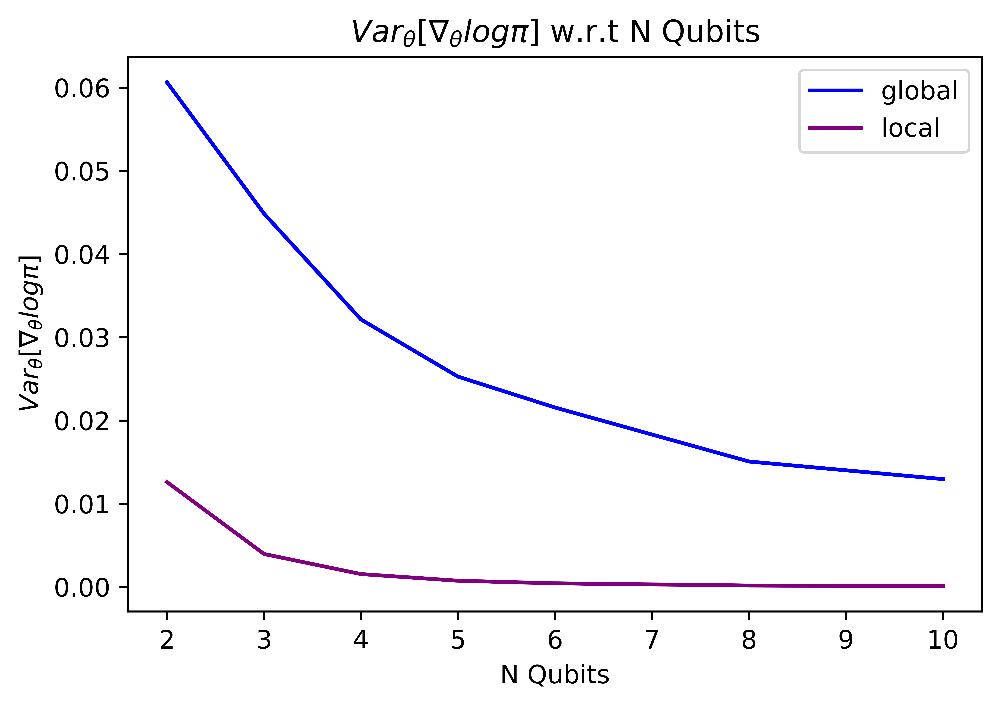

In [264]:
variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,variances_global, color="blue", label="global")
plt.plot(qubits,variances_local, color="purple", label="local")
plt.legend()
plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.xlabel("N Qubits")
plt.show()

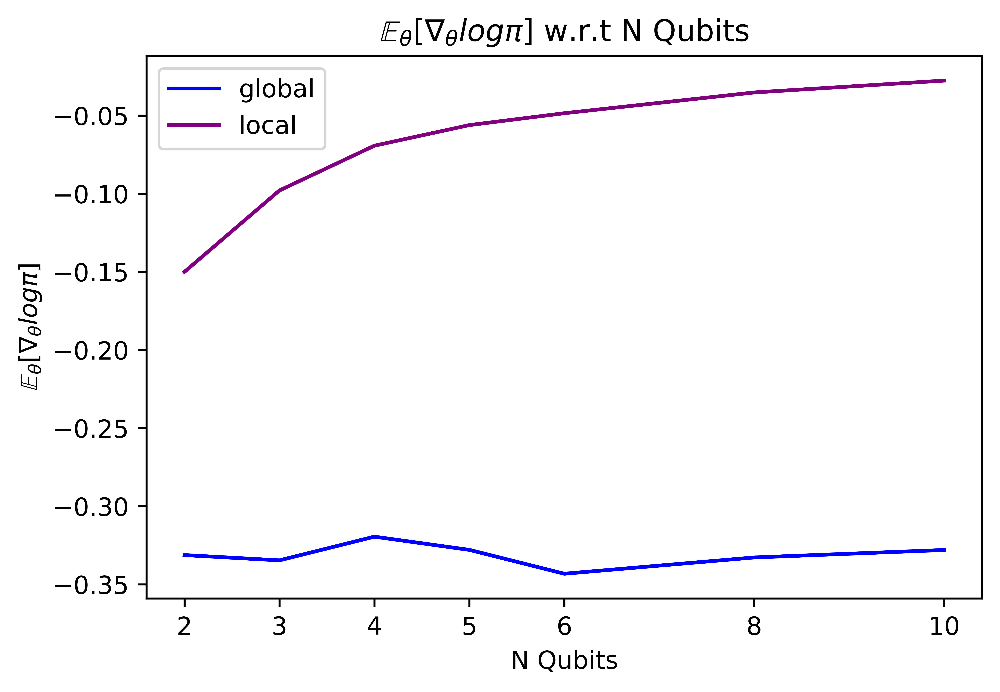

In [266]:
exp_global = np.array(exp_global)
exp_local = np.array(exp_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,exp_global, color="blue", label="global")
plt.plot(qubits,exp_local, color="purple", label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("N Qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()

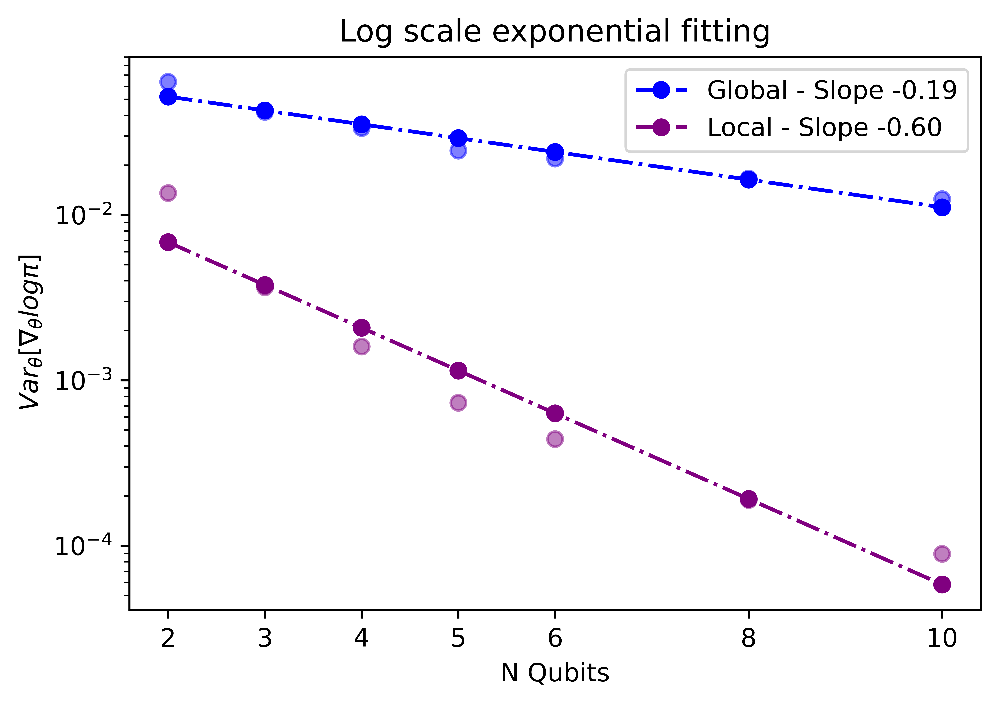

In [232]:
p = np.polyfit(qubits, np.log(variances_global), 1)
p2 = np.polyfit(qubits, np.log(variances_local), 1)

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.semilogy(qubits, variances_global, "o" , color="blue" , alpha=0.5)
plt.semilogy(qubits, np.exp(p[0] * qubits + p[1]), "o-.", color="blue", label="Global - Slope {:3.2f}".format(p[0]))
plt.semilogy(qubits, variances_local, "o" , color="purple", alpha=0.5)
plt.semilogy(qubits,  np.exp(p2[0] * qubits + p2[1]), "o-.", color="purple", label="Local - Slope {:3.2f}".format(p2[0]))
plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend()
plt.title("Log scale exponential fitting")
plt.show()

## Example - Rx parameterized model presented in Cost function barren plateaus
Global $L(\theta) = 1 - \prod_{i=0}^{n-1} cos(\theta_i)^2$ 

Local $L(\theta) = 1 - \frac{1}{n}\sum_{i=0}^{n-1} cos(\theta_i)^2$

In [251]:
def grad_global(param):
    #return np.array([-2*np.tan(param[i]) for i in range(len(param))])
    grads = []
    for i in range(len(param)):
        den = 1
        for j in range(len(param)):
            if i != j:
                den *= np.cos(param[j])**2
        grads.append((2*np.cos(param[i])*np.sin(param[i])*den))
    return grads

def grad_local(param):
    den = np.sum(np.array([np.cos(p)**2 for p in param]))
    return np.array([(2*np.cos(param[i])*np.sin(param[i])) for i in range(len(param))])
    #return np.array([(-2*np.cos(param[i])*np.sin(param[i]))/den for i in range(len(param))])


In [252]:
qubits = [2, 3, 4, 5, 6, 8, 10,12,14,16,18,20]
variances_global = []
variances_local = []
exp_global = []
exp_local = []
variances_local_normal = []
num_samples = 1000

for n_qubits in qubits:
    print("number of qubits - ", n_qubits)
    grad_vals_global = []
    grad_vals_local = []
    #grad_vals_local_n = []
    for i in range(num_samples):
        w = np.random.random(size=n_qubits)
        wn = np.random.normal(0,1,size=n_qubits)
        grad_vals_global.append(np.mean(grad_global(w)))#grad_global))
        grad_vals_local.append(np.mean(grad_local(w)))#grad_global))
        #grad_vals_local_n.append(np.mean(grad_local(wn)))#grad_global))

    
    variances_global.append(np.var(grad_vals_global))
    variances_local.append(np.var(grad_vals_local))
    exp_global.append(np.mean(grad_vals_global))
    exp_local.append(np.mean(grad_vals_local))
    #variances_local_normal.append(np.var(grad_vals_local_n))

number of qubits -  2
number of qubits -  3
number of qubits -  4
number of qubits -  5
number of qubits -  6
number of qubits -  8
number of qubits -  10
number of qubits -  12
number of qubits -  14
number of qubits -  16
number of qubits -  18
number of qubits -  20


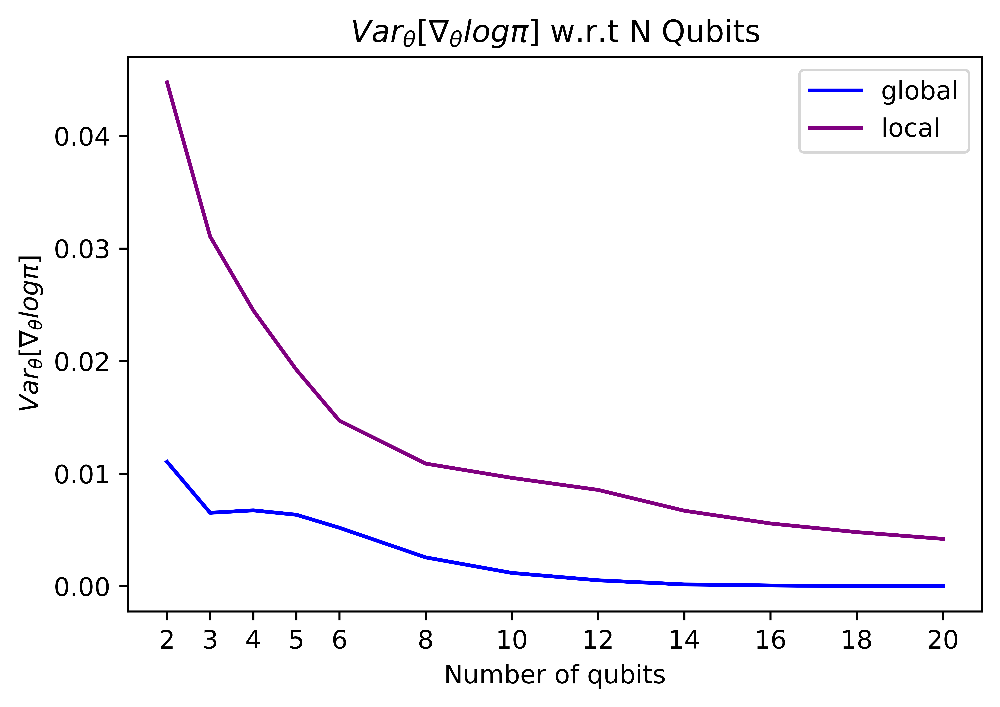

In [244]:
variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,variances_global, color="blue", label="global")
plt.plot(qubits,variances_local, color="purple" , label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("Number of qubits")
plt.xticks(qubits)
plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.show()

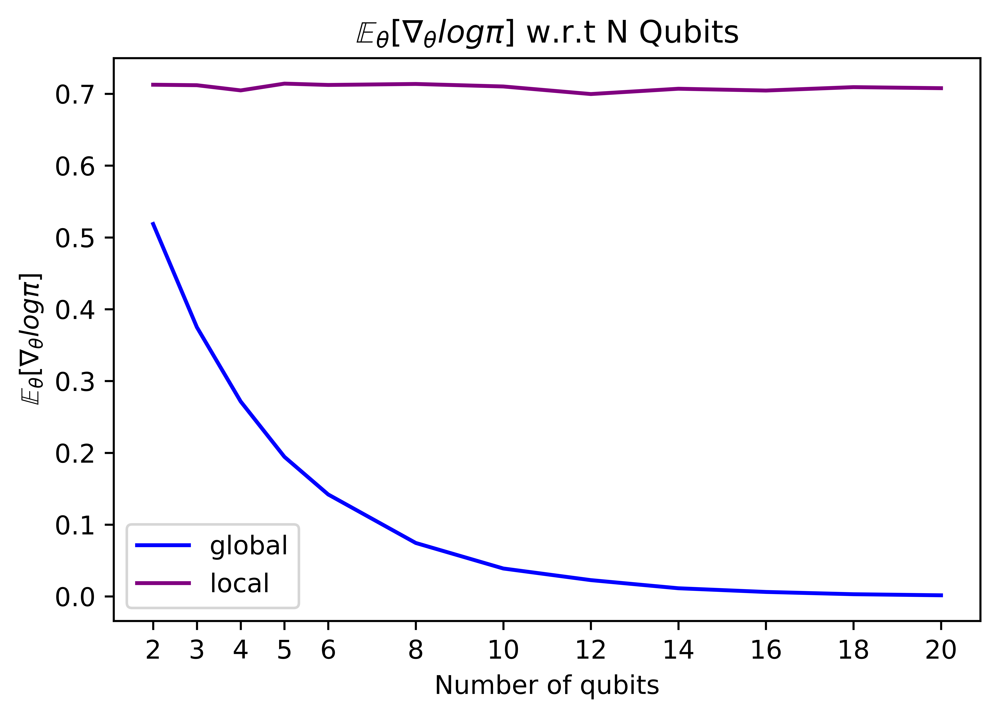

In [245]:
exp_global = np.array(exp_global)
exp_local = np.array(exp_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,exp_global, color="blue", label="global")
plt.plot(qubits,exp_local, color="purple", label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("Number of qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()

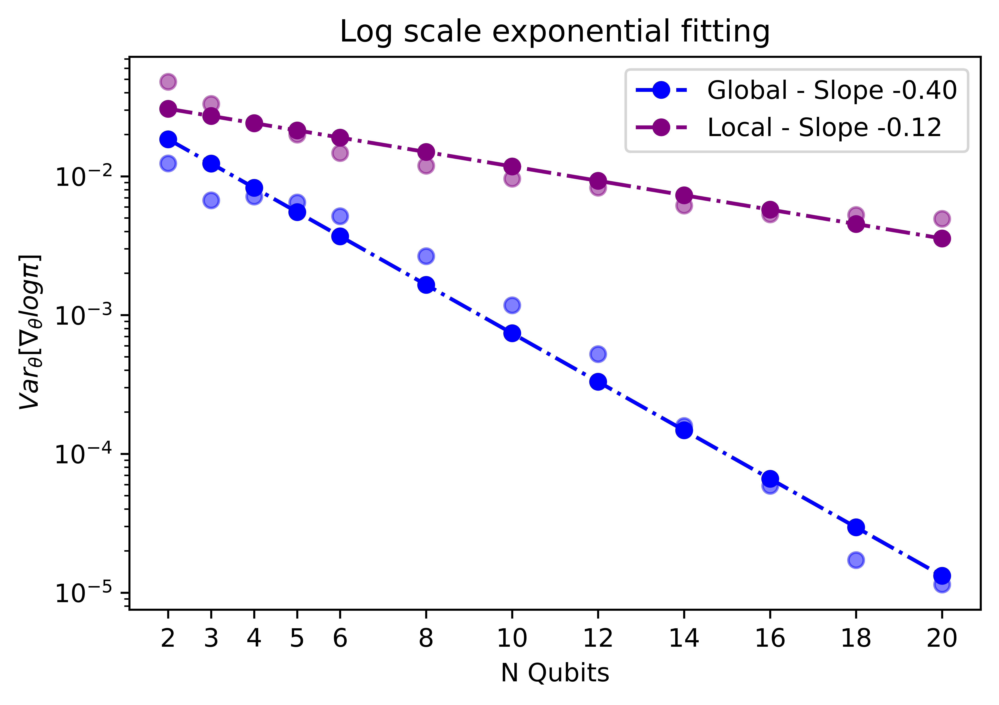

In [253]:
p = np.polyfit(qubits, np.log(variances_global), 1)
p2 = np.polyfit(qubits, np.log(variances_local), 1)
#p3 = np.polyfit(qubits, np.log(variances_local_normal), 1)

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.semilogy(qubits, variances_global, "o" , color="blue" , alpha=0.5)
plt.semilogy(qubits, np.exp(p[0] * qubits + p[1]), "o-.", color="blue", label="Global - Slope {:3.2f}".format(p[0]))
plt.semilogy(qubits, variances_local, "o" , color="purple", alpha=0.5)
plt.semilogy(qubits,  np.exp(p2[0] * qubits + p2[1]), "o-.", color="purple", label="Local - Slope {:3.2f}".format(p2[0]))
#plt.semilogy(qubits, variances_local_normal, "o" , color="darkorange",alpha=0.5)
#plt.semilogy(qubits,  np.exp(p3[0] * qubits + p3[1]), "o-.", color="darkorange", label="Local normal(0,1) - Slope {:3.2f}".format(p3[0]))
plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend()
plt.title("Log scale exponential fitting")
plt.show()

## Log policy 
Global $\pi(\theta) = \prod_{i=0}^{n-1} cos(\theta_i)^2$ 

Local $\pi(\theta) = \frac{1}{n}\sum_{i=0}^{n-1} cos(\theta_i)^2$

In [255]:
def grad_global(param):
    #return np.array([-2*np.tan(param[i]) for i in range(len(param))])
    grads = [-2*np.tan(p) for p in param]
    return grads

def grad_local(param):
    den = np.sum([np.cos(p)**2 for p in param])
    grads = [-2*np.cos(p)*np.sin(p)/den for p in param]
    return grads
    #return np.array([(-2*np.cos(param[i])*np.sin(param[i]))/den for i in range(len(param))])


In [259]:
qubits = [2, 3, 4, 5, 6, 8,10]#,12,14,16,18,20]
variances_global = []
#variances_global_normal = []
variances_local = []
#variances_local_normal = []
exp_global=[]
exp_local=[]
num_samples = 10000

for n_qubits in qubits:
    print("number of qubits - ", n_qubits)
    grad_vals_global = []
    #grad_vals_global_n = []
    grad_vals_local = []
    #grad_vals_local_n = []
    for i in range(num_samples):
        w = np.random.random(size=n_qubits)
        wnt = np.random.normal(np.pi/4,1,size=n_qubits)
        wn = np.random.normal(0,1,size=n_qubits)
        grad_vals_global.append(np.mean(grad_global(w)))#grad_global))
        #grad_vals_global_n.append(np.mean(grad_global(wnt)))#grad_global))
        grad_vals_local.append(np.mean(grad_local(w)))#grad_global))
        #grad_vals_local_n.append(np.mean(grad_local(wn)))#grad_global))

    variances_global.append(np.var(grad_vals_global))
    #variances_global_normal.append(np.var(grad_vals_global_n))
    variances_local.append(np.var(grad_vals_local))
    exp_global.append(np.mean(grad_vals_global))
    exp_local.append(np.mean(grad_vals_local))

number of qubits -  2
number of qubits -  3
number of qubits -  4
number of qubits -  5
number of qubits -  6
number of qubits -  8
number of qubits -  10


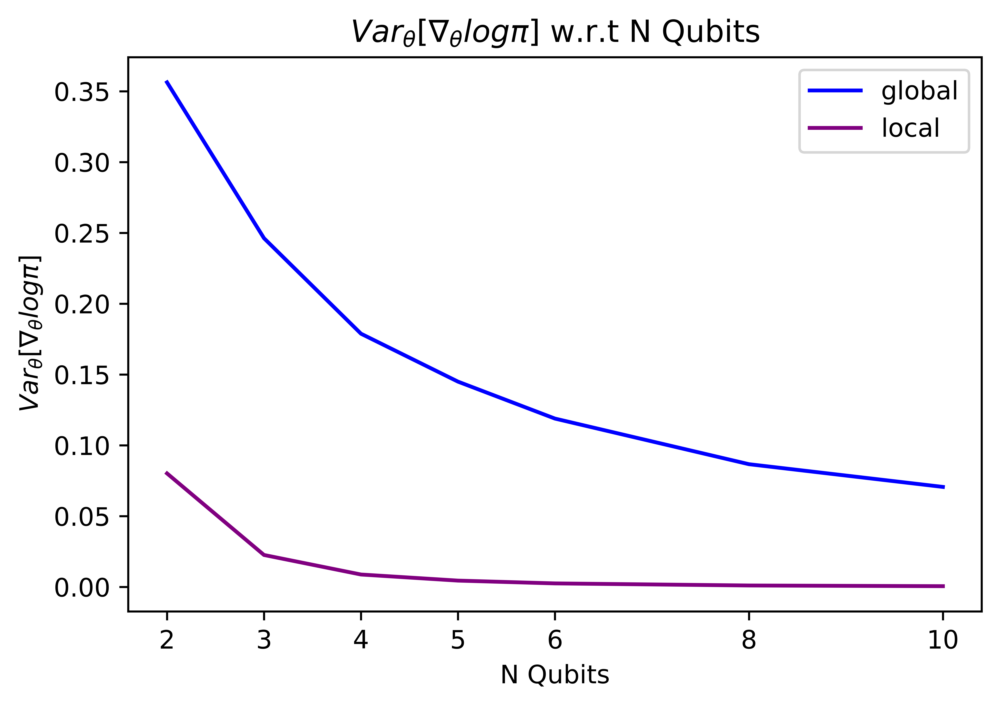

In [260]:
variances_global = np.array(variances_global)
#variances_global_normal = np.array(variances_global_normal)
variances_local = np.array(variances_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,variances_global, color="blue", label="global")
#plt.plot(qubits,variances_global_normal, color="lightblue", label="global normal(0,1)")
plt.plot(qubits,variances_local, color="purple" , label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.show()

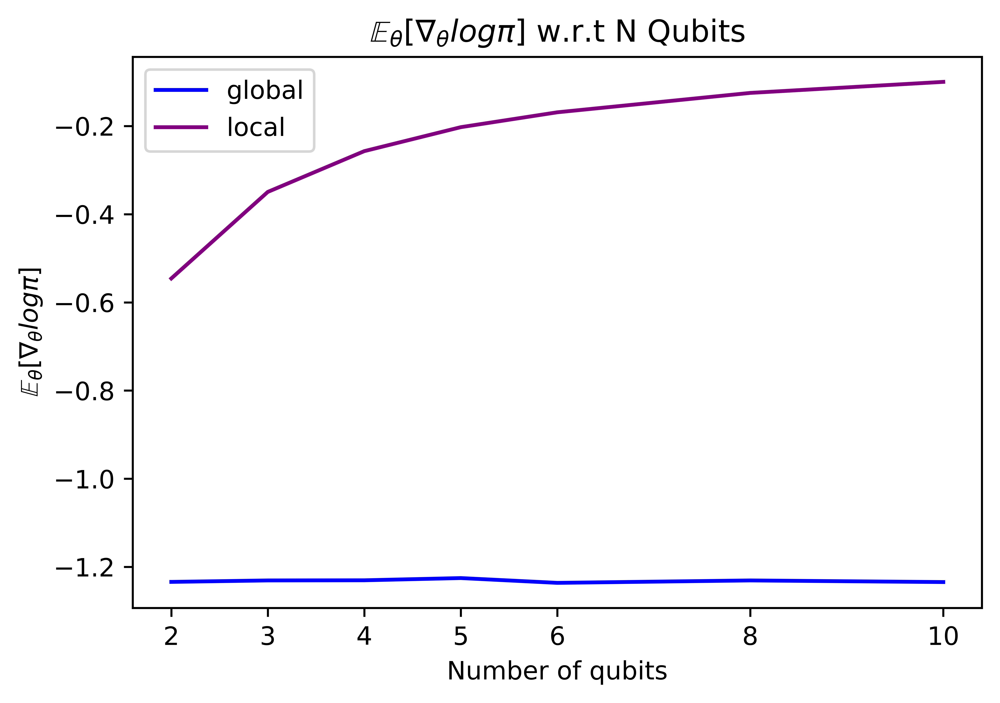

In [261]:
exp_global = np.array(exp_global)
exp_local = np.array(exp_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,exp_global, color="blue", label="global")
plt.plot(qubits,exp_local, color="purple", label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("Number of qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()

In [270]:
-(2/0.99)*np.log(np.cos(0.99))

1.2125695233772695

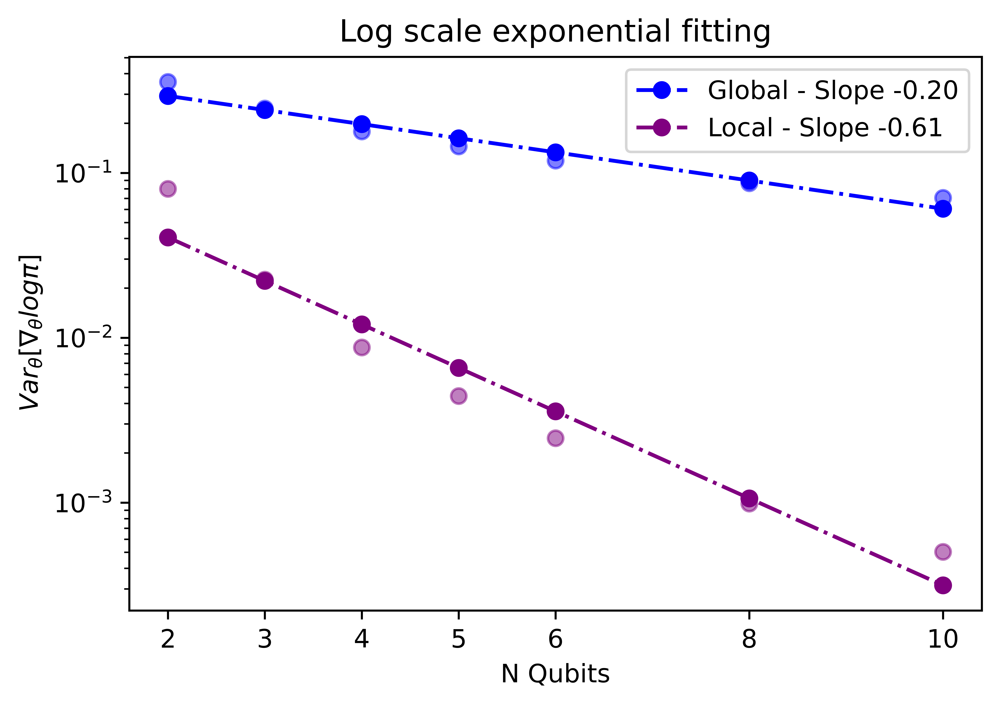

In [262]:
p = np.polyfit(qubits, np.log(variances_global), 1)
p2 = np.polyfit(qubits, np.log(variances_local), 1)
#p3 = np.polyfit(qubits, np.log(variances_local_normal), 1)

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.semilogy(qubits, variances_global, "o" , color="blue" , alpha=0.5)
plt.semilogy(qubits, np.exp(p[0] * qubits + p[1]), "o-.", color="blue", label="Global - Slope {:3.2f}".format(p[0]))
plt.semilogy(qubits, variances_local, "o" , color="purple", alpha=0.5)
plt.semilogy(qubits,  np.exp(p2[0] * qubits + p2[1]), "o-.", color="purple", label="Local - Slope {:3.2f}".format(p2[0]))
#plt.semilogy(qubits, variances_local_normal, "o" , color="darkorange",alpha=0.5)
#plt.semilogy(qubits,  np.exp(p3[0] * qubits + p3[1]), "o-.", color="darkorange", label="Local normal(0,1) - Slope {:3.2f}".format(p3[0]))
plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend()
plt.title("Log scale exponential fitting")
plt.show()

## Strongly entangling layers single layer

In [274]:
qubits = [2, 3, 4, 5, 6, 8, 10]
variances_global = []
variances_local = []
exp_global=[]
exp_local=[]
num_samples = 1000

for n_qubits in qubits:
    print("number of qubits - ", n_qubits)
    grad_vals_global = []
    grad_vals_local = []
    for i in range(num_samples):
        dev = qml.device("default.qubit", wires=n_qubits)
        dev2 = qml.device("default.qubit", wires=n_qubits)

        gate_set = [qml.RX, qml.RY, qml.RZ]
        random_gate_sequence = {i: np.random.choice(gate_set) for i in range(n_qubits)}

        @qml.qnode(dev, interface="torch", diff_method="backprop")
        def rand_circuit_global(params):
            
            qml.StronglyEntanglingLayers(weights=params, wires=range(n_qubits))

            return qml.probs(wires=range(n_qubits))

        @qml.qnode(dev2, interface="torch", diff_method="backprop")
        def rand_circuit_local(params,qubit=0):

            qml.StronglyEntanglingLayers(weights=params, wires=range(n_qubits))

            return qml.probs(wires=qubit)
            
        def global_loss(params):
            probs = rand_circuit_global(params)[0]
            #return np.log(probs)
            return torch.log(probs)
            #return 1 - probs

        def local_loss(params):
            probs = torch.stack([rand_circuit_local(params,qubit=i)[0] for i in range(n_qubits)])
            #probs = rand_circuit_local(params)

            #return np.log(np.prod(probs))
            return torch.log(torch.mean(probs))
            #return 1 - torch.mean(probs)
            #return 1 - np.prod(probs[:,0])
            
        #params = np.random.random(size=n_qubits, requires_grad = True)
        shape = qml.StronglyEntanglingLayers.shape(n_layers=1, n_wires=n_qubits)
        weights = np.random.random(size=shape)      
        params = torch.tensor(weights, requires_grad = True)
        params2 = torch.tensor(weights, requires_grad = True)
        #grad_global = qml.grad(global_loss,argnum=0)#(params)
        #grad_vals_global.append(np.mean(grad_global(params)))#grad_global))
        global_cost = global_loss(params)
        global_cost.backward()
        grad_global = params.grad
        grad_vals_global.append(np.mean(grad_global.numpy()))#grad_global))

        local_cost = local_loss(params2)
        local_cost.backward()
        grad_local = params2.grad
        grad_vals_local.append(np.mean(grad_local.numpy()))#grad_global))
    variances_global.append(np.var(grad_vals_global))
    variances_local.append(np.var(grad_vals_local))
    exp_global.append(np.mean(grad_vals_global))
    exp_local.append(np.mean(grad_vals_local))

variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)


number of qubits -  2
number of qubits -  3
number of qubits -  4
number of qubits -  5
number of qubits -  6
number of qubits -  8
number of qubits -  10


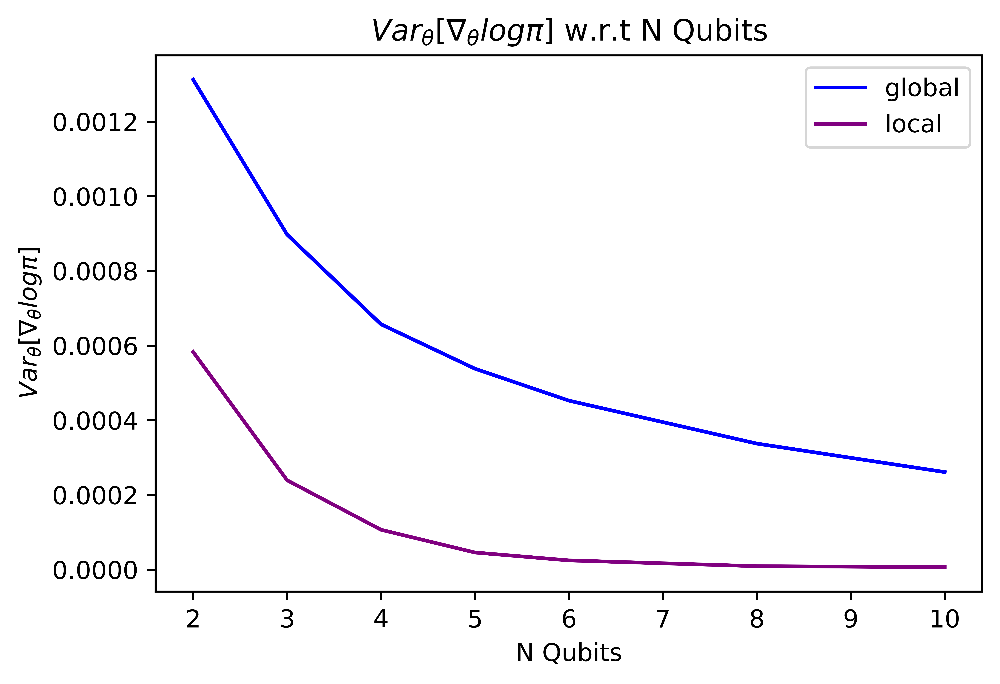

In [275]:
variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,variances_global, color="blue", label="global")
plt.plot(qubits,variances_local, color="purple", label="local")
plt.legend()
plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.xlabel("N Qubits")
plt.show()

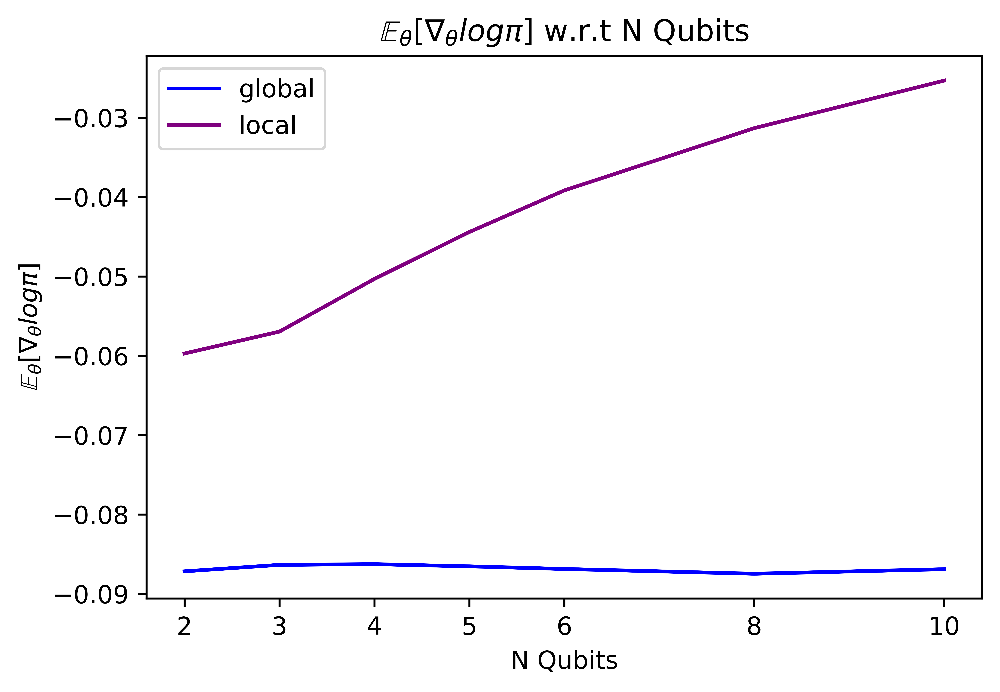

In [276]:
exp_global = np.array(exp_global)
exp_local = np.array(exp_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,exp_global, color="blue", label="global")
plt.plot(qubits,exp_local, color="purple", label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("N Qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()

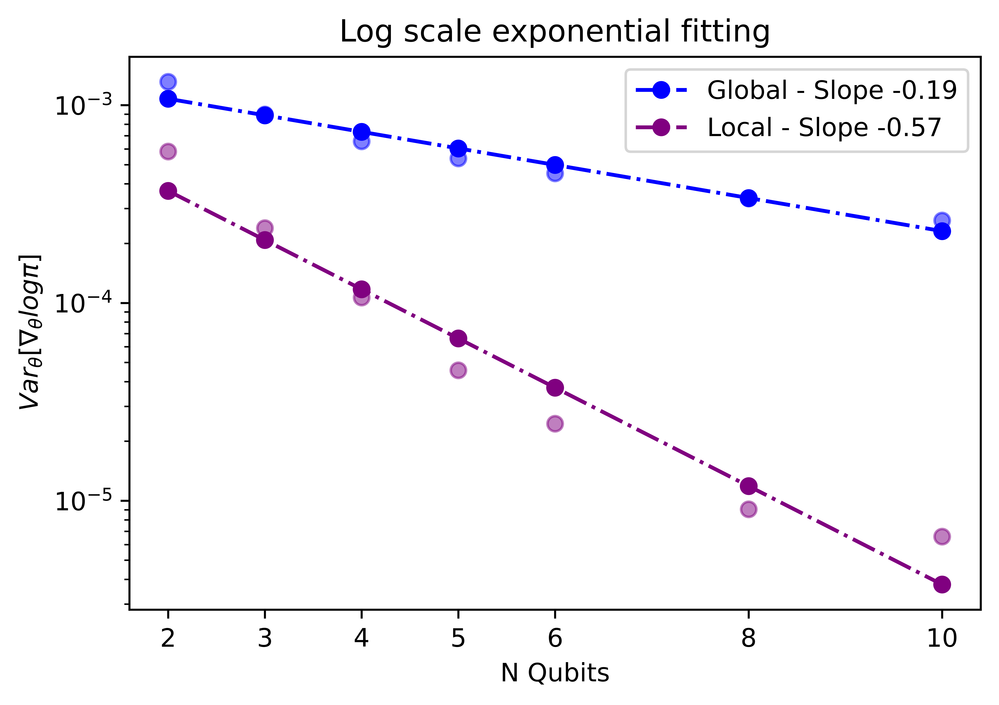

In [277]:
p = np.polyfit(qubits, np.log(variances_global), 1)
p2 = np.polyfit(qubits, np.log(variances_local), 1)

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.semilogy(qubits, variances_global, "o" , color="blue" , alpha=0.5)
plt.semilogy(qubits, np.exp(p[0] * qubits + p[1]), "o-.", color="blue", label="Global - Slope {:3.2f}".format(p[0]))
plt.semilogy(qubits, variances_local, "o" , color="purple", alpha=0.5)
plt.semilogy(qubits,  np.exp(p2[0] * qubits + p2[1]), "o-.", color="purple", label="Local - Slope {:3.2f}".format(p2[0]))
plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend()
plt.title("Log scale exponential fitting")
plt.show()

## Strongly Entangling Layers with multiple layers 

In [288]:
qubits = [2, 3, 4, 5, 6, 8, 10]
layers = [1,2,3,4]
variances_global = []
variances_local = []
exp_global=[]
exp_local=[]
variances_global_layers = []
variances_local_layers = []
exp_global_layers=[]
exp_local_layers=[]
num_samples = 1000
for l in layers:
    print("-number of layers - ",l)
    variances_global=[]
    variances_local=[]
    exp_global=[]
    exp_local=[] 
    for n_qubits in qubits:
        print("---number of qubits - ", n_qubits)
        grad_vals_global = []
        grad_vals_local = []
        for i in range(num_samples):
            dev = qml.device("default.qubit", wires=n_qubits)
            dev2 = qml.device("default.qubit", wires=n_qubits)

            gate_set = [qml.RX, qml.RY, qml.RZ]
            random_gate_sequence = {i: np.random.choice(gate_set) for i in range(n_qubits)}

            @qml.qnode(dev, interface="torch", diff_method="backprop")
            def rand_circuit_global(params):
                
                qml.StronglyEntanglingLayers(weights=params, wires=range(n_qubits))

                return qml.probs(wires=range(n_qubits))

            @qml.qnode(dev2, interface="torch", diff_method="backprop")
            def rand_circuit_local(params,qubit=0):

                qml.StronglyEntanglingLayers(weights=params, wires=range(n_qubits))

                return qml.probs(wires=qubit)
                
            def global_loss(params):
                probs = rand_circuit_global(params)[0]
                #return np.log(probs)
                return torch.log(probs)
                #return 1 - probs

            def local_loss(params):
                probs = torch.stack([rand_circuit_local(params,qubit=i)[0] for i in range(n_qubits)])
                #probs = rand_circuit_local(params)

                #return np.log(np.prod(probs))
                return torch.log(torch.mean(probs))
                #return 1 - torch.mean(probs)
                #return 1 - np.prod(probs[:,0])
                
            #params = np.random.random(size=n_qubits, requires_grad = True)
            shape = qml.StronglyEntanglingLayers.shape(n_layers=l, n_wires=n_qubits)
            weights = np.random.random(size=shape)      
            params = torch.tensor(weights, requires_grad = True)
            params2 = torch.tensor(weights, requires_grad = True)
            #grad_global = qml.grad(global_loss,argnum=0)#(params)
            #grad_vals_global.append(np.mean(grad_global(params)))#grad_global))
            global_cost = global_loss(params)
            global_cost.backward()
            grad_global = params.grad
            grad_vals_global.append(np.mean(grad_global.numpy()))#grad_global))

            local_cost = local_loss(params2)
            local_cost.backward()
            grad_local = params2.grad
            grad_vals_local.append(np.mean(grad_local.numpy()))#grad_global))
        variances_global.append(np.var(grad_vals_global))
        variances_local.append(np.var(grad_vals_local))
        exp_global.append(np.mean(grad_vals_global))
        exp_local.append(np.mean(grad_vals_local))
    variances_global_layers.append(variances_global)
    variances_local_layers.append(variances_local)
    exp_global_layers.append(exp_global)
    exp_local_layers.append(exp_local)

variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)


-number of layers -  1
---number of qubits -  2
---number of qubits -  3
---number of qubits -  4
---number of qubits -  5
---number of qubits -  6
---number of qubits -  8
---number of qubits -  10
-number of layers -  2
---number of qubits -  2
---number of qubits -  3
---number of qubits -  4
---number of qubits -  5
---number of qubits -  6
---number of qubits -  8
---number of qubits -  10
-number of layers -  3
---number of qubits -  2
---number of qubits -  3
---number of qubits -  4
---number of qubits -  5
---number of qubits -  6
---number of qubits -  8
---number of qubits -  10
-number of layers -  4
---number of qubits -  2
---number of qubits -  3
---number of qubits -  4
---number of qubits -  5
---number of qubits -  6
---number of qubits -  8
---number of qubits -  10


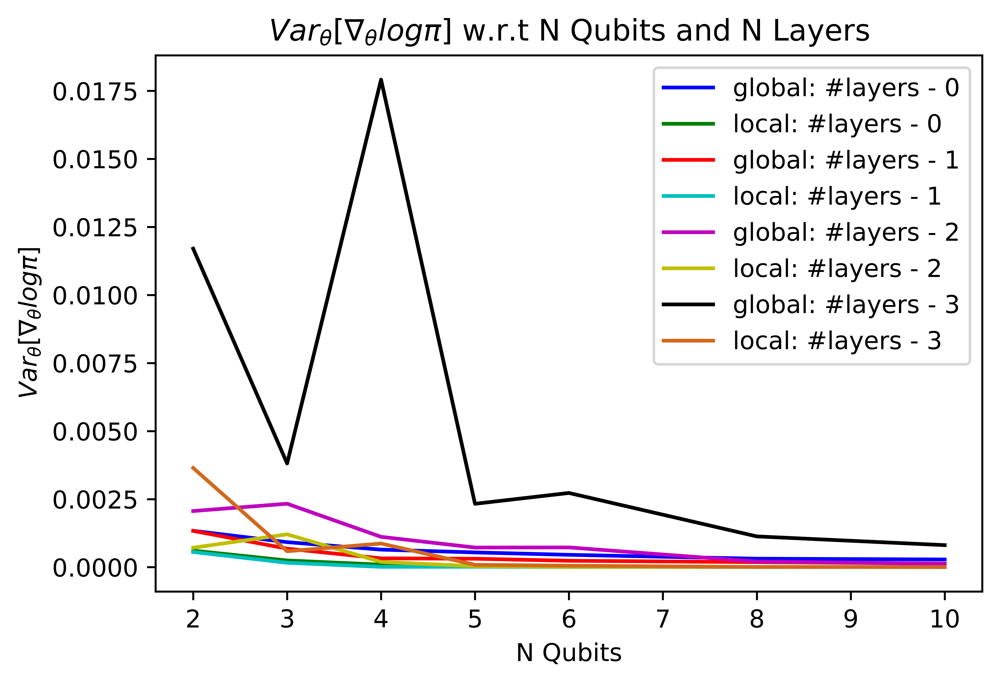

In [303]:
qubits = np.array(qubits)
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
colors = ['b','g','r','c','m','y','k','chocolate']
c=0
for l in range(len(layers)):

    plt.plot(qubits, variances_global_layers[l], color=colors[c], label="global: #layers - {}".format(l))
    plt.plot(qubits, variances_local_layers[l], color=colors[c+1], label="local: #layers - {}".format(l))
    c+=2

plt.legend()
plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits and N Layers")
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.xlabel("N Qubits")
plt.show()

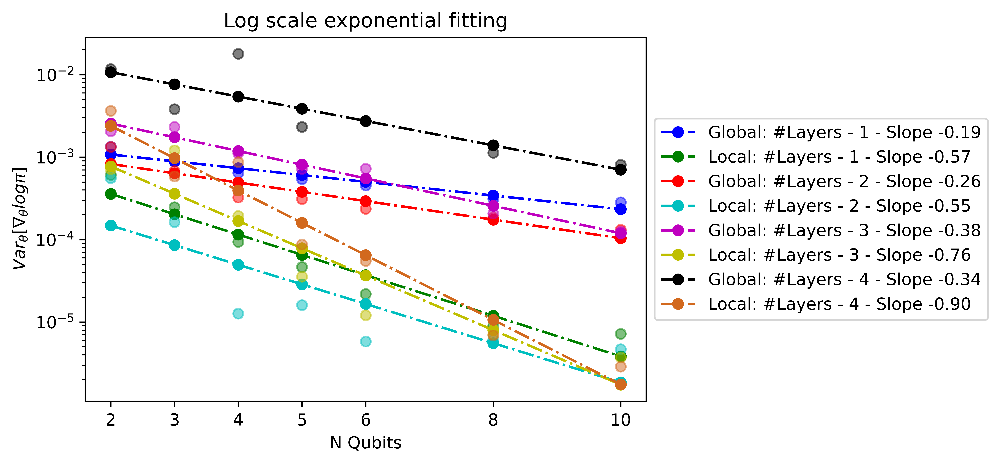

In [302]:
pg=[]
pl=[]
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(variances_global_layers[l]), 1))
    pl.append(np.polyfit(qubits, np.log(variances_local_layers[l]), 1))

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

colors = ['b','g','r','c','m','y','k','chocolate']
count=0
for l in range(len(layers)):

    plt.semilogy(qubits, variances_global_layers[l], "o" ,color=colors[count], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-.",color=colors[count],label="Global: #Layers - {} - Slope {:3.2f}".format(l+1,pg[l][0]))
    count+=1
    plt.semilogy(qubits, variances_local_layers[l], "o" , color=colors[count], alpha=0.5)
    plt.semilogy(qubits,  np.exp(pl[l][0] * qubits + pl[l][1]), "o-.", color=colors[count],label="Local: #Layers - {} - Slope {:3.2f}".format(l+1,pl[l][0]))
    count+=1

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Log scale exponential fitting")
plt.show()

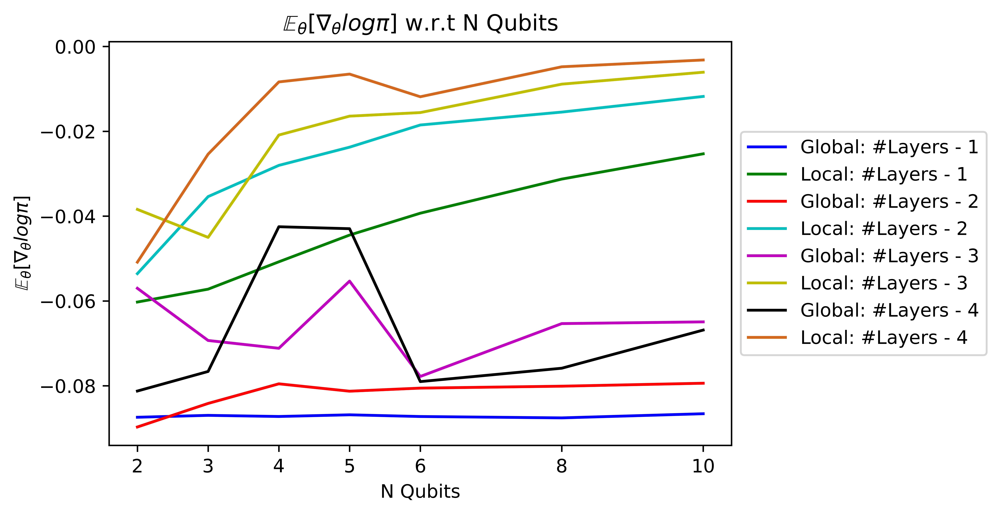

In [308]:
qubits = np.array(qubits)
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

colors = ['b','g','r','c','m','y','k','chocolate']
count=0
for l in range(len(layers)):

    plt.plot(qubits, exp_global_layers[l],color=colors[count], label="Global: #Layers - {}".format(l+1))
    plt.plot(qubits, exp_local_layers[l], color=colors[count+1], label="Local: #Layers - {}".format(l+1))
    count+=2

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel("N Qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()